In [214]:
import numpy as np
import pandas as pd
from itertools import product
import scipy.stats as ss
import math
from pyod.models.ecod import ECOD
from yellowbrick.cluster import KElbowVisualizer
import re
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import plotly.express as px
import plotly.graph_objects as go
import seaborn as sns
import shap
from sentence_transformers import SentenceTransformer
from sklearn.model_selection import train_test_split
# sklearn 
from sklearn.cluster import KMeans
from sklearn.manifold import TSNE
from sklearn.metrics import silhouette_score, silhouette_samples, accuracy_score, classification_report, davies_bouldin_score, calinski_harabasz_score

import lightgbm as lgb
import prince
import prince
import time
from sklearn import metrics

In [160]:
df=pd.read_csv(r'C:\Users\Dell\Documents\projects\customer segmentation\online_Marketing_campaign.csv')
df=df.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

### Loading the dataset and renaming the columns.

In [161]:
os.listdir(r'C:\Users\Dell\Documents\')

SyntaxError: unterminated string literal (detected at line 1) (1219300163.py, line 1)

In [162]:
df

,campaign_item_id,no_of_days,time,ext_service_id,ext_service_name,creative_id,creative_width,creative_height,search_tags,template_id,...,exchange_rate,media_cost_usd,position_in_content,unique_reach,total_reach,search_tag_cat,cmi_currency_code,timezone,weekday_cat,keywords
0,2733,7,2022-05-01,128,Facebook Ads,1000,300.0,250.0,#The Power of X,90.0,...,1,14.058514,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_end,delicate bracelets
1,2733,8,2022-05-02,16,DV360,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,99.633496,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,summer jewelry
2,2733,9,2022-05-03,128,Facebook Ads,1000,300.0,250.0,#Embrace Your Individuality with X,90.0,...,1,109.419677,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,artisan jewelry
3,2733,10,2022-05-04,128,Facebook Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,115.209499,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,layered bracelets
4,2733,11,2022-05-05,4,Google Ads,1000,300.0,250.0,#Be Bold. Be X,90.0,...,1,66.990104,NaN,NaN,NaN,Others,SGD,Asia/Singapore,week_day,minimalist jewelry
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
72607,3567,11,2022-11-28,4,Google Ads,15605,NaN,NaN,#The X Factor - Fashion for the Fearless,NaN,...,1,4.858090,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,chic jewelry
72608,3567,12,2022-11-29,128,Facebook Ads,15605,NaN,NaN,#Embrace Your Individuality with X,NaN,...,1,3.536262,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,statement pins
72609,3567,13,2022-11-30,128,Facebook Ads,15605,NaN,NaN,#The Power of X,NaN,...,1,1.947816,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,bridal jewelry
72610,3567,14,2022-12-01,4,Google Ads,15605,NaN,NaN,#Embrace Your Individuality with X,NaN,...,1,1.711467,NaN,NaN,NaN,Others,INR,Asia/Kolkata,week_day,jewelry sets


In [163]:
df.columns

Index(['campaign_item_id', 'no_of_days', 'time', 'ext_service_id',
       'ext_service_name', 'creative_id', 'creative_width', 'creative_height',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'approved_budget',
       'advertiser_currency', 'channel_id', 'channel_name', 'max_bid_cpm',
       'network_margin', 'campaign_budget_usd', 'impressions', 'clicks',
       'stats_currency', 'currency_code', 'exchange_rate', 'media_cost_usd',
       'position_in_content', 'unique_reach', 'total_reach', 'search_tag_cat',
       'cmi_currency_code', 'timezone', 'weekday_cat', 'keywords'],
      dtype='object')

In [164]:
df.dtypes

campaign_item_id         int64
no_of_days               int64
time                    object
ext_service_id           int64
ext_service_name        object
creative_id              int64
creative_width         float64
creative_height        float64
search_tags             object
template_id            float64
landing_page            object
advertiser_id            int64
advertiser_name         object
network_id               int64
approved_budget        float64
advertiser_currency     object
channel_id               int64
channel_name            object
max_bid_cpm            float64
network_margin         float64
campaign_budget_usd    float64
impressions              int64
clicks                   int64
stats_currency          object
currency_code           object
exchange_rate            int64
media_cost_usd         float64
position_in_content    float64
unique_reach           float64
total_reach            float64
search_tag_cat          object
cmi_currency_code       object
timezone

In [165]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72612 entries, 0 to 72611
Data columns (total 35 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     72612 non-null  int64  
 1   no_of_days           72612 non-null  int64  
 2   time                 72612 non-null  object 
 3   ext_service_id       72612 non-null  int64  
 4   ext_service_name     72612 non-null  object 
 5   creative_id          72612 non-null  int64  
 6   creative_width       69200 non-null  float64
 7   creative_height      69200 non-null  float64
 8   search_tags          72612 non-null  object 
 9   template_id          69200 non-null  float64
 10  landing_page         72612 non-null  object 
 11  advertiser_id        72612 non-null  int64  
 12  advertiser_name      72612 non-null  object 
 13  network_id           72612 non-null  int64  
 14  approved_budget      72206 non-null  float64
 15  advertiser_currency  72612 non-null 

In [166]:
new=df.drop(columns=['position_in_content', 'unique_reach', 'total_reach','network_margin'])

### Dropping unnecessary columns (empty columns/constant values)

In [167]:
new.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 72612 entries, 0 to 72611
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     72612 non-null  int64  
 1   no_of_days           72612 non-null  int64  
 2   time                 72612 non-null  object 
 3   ext_service_id       72612 non-null  int64  
 4   ext_service_name     72612 non-null  object 
 5   creative_id          72612 non-null  int64  
 6   creative_width       69200 non-null  float64
 7   creative_height      69200 non-null  float64
 8   search_tags          72612 non-null  object 
 9   template_id          69200 non-null  float64
 10  landing_page         72612 non-null  object 
 11  advertiser_id        72612 non-null  int64  
 12  advertiser_name      72612 non-null  object 
 13  network_id           72612 non-null  int64  
 14  approved_budget      72206 non-null  float64
 15  advertiser_currency  72612 non-null 

In [168]:
new['max_bid_cpm'].fillna('0',inplace=True)

In [169]:
new.dropna(inplace=True)
new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68880 entries, 0 to 69199
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     68880 non-null  int64  
 1   no_of_days           68880 non-null  int64  
 2   time                 68880 non-null  object 
 3   ext_service_id       68880 non-null  int64  
 4   ext_service_name     68880 non-null  object 
 5   creative_id          68880 non-null  int64  
 6   creative_width       68880 non-null  float64
 7   creative_height      68880 non-null  float64
 8   search_tags          68880 non-null  object 
 9   template_id          68880 non-null  float64
 10  landing_page         68880 non-null  object 
 11  advertiser_id        68880 non-null  int64  
 12  advertiser_name      68880 non-null  object 
 13  network_id           68880 non-null  int64  
 14  approved_budget      68880 non-null  float64
 15  advertiser_currency  68880 non-null 

In [170]:
sam=new.copy()

### Replaced null values with '0' and removed other useless rows with 

In [171]:
df_cat=pd.DataFrame(new,columns=['campaign_item_id', 'ext_service_id',
       'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id',
       'advertiser_currency', 'channel_id', 'channel_name', 'max_bid_cpm',
       'stats_currency', 'currency_code',
       'search_tag_cat',
       'cmi_currency_code', 'timezone', 'weekday_cat', 'keywords'])

In [172]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68880 entries, 0 to 69199
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     68880 non-null  int64  
 1   ext_service_id       68880 non-null  int64  
 2   ext_service_name     68880 non-null  object 
 3   creative_id          68880 non-null  int64  
 4   search_tags          68880 non-null  object 
 5   template_id          68880 non-null  float64
 6   landing_page         68880 non-null  object 
 7   advertiser_id        68880 non-null  int64  
 8   advertiser_name      68880 non-null  object 
 9   network_id           68880 non-null  int64  
 10  advertiser_currency  68880 non-null  object 
 11  channel_id           68880 non-null  int64  
 12  channel_name         68880 non-null  object 
 13  max_bid_cpm          68880 non-null  object 
 14  stats_currency       68880 non-null  object 
 15  currency_code        68880 non-null 

In [173]:
df_cat.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68880 entries, 0 to 69199
Data columns (total 21 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     68880 non-null  int64  
 1   ext_service_id       68880 non-null  int64  
 2   ext_service_name     68880 non-null  object 
 3   creative_id          68880 non-null  int64  
 4   search_tags          68880 non-null  object 
 5   template_id          68880 non-null  float64
 6   landing_page         68880 non-null  object 
 7   advertiser_id        68880 non-null  int64  
 8   advertiser_name      68880 non-null  object 
 9   network_id           68880 non-null  int64  
 10  advertiser_currency  68880 non-null  object 
 11  channel_id           68880 non-null  int64  
 12  channel_name         68880 non-null  object 
 13  max_bid_cpm          68880 non-null  object 
 14  stats_currency       68880 non-null  object 
 15  currency_code        68880 non-null 

In [174]:
df_cont=pd.DataFrame(new,columns=[ 'no_of_days','creative_width', 'creative_height',
        'approved_budget',
        'campaign_budget_usd', 'impressions', 'clicks',
        'exchange_rate', 'media_cost_usd',
       ])

In [175]:
df_cont.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68880 entries, 0 to 69199
Data columns (total 9 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   no_of_days           68880 non-null  int64  
 1   creative_width       68880 non-null  float64
 2   creative_height      68880 non-null  float64
 3   approved_budget      68880 non-null  float64
 4   campaign_budget_usd  68880 non-null  float64
 5   impressions          68880 non-null  int64  
 6   clicks               68880 non-null  int64  
 7   exchange_rate        68880 non-null  int64  
 8   media_cost_usd       68880 non-null  float64
dtypes: float64(5), int64(4)
memory usage: 5.3 MB


In [176]:
df_cat.columns

Index(['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords'],
      dtype='object')

In [177]:
cat_var1=('campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords')
cat_var2=('campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords')
cat_var_prod = list(product(cat_var1,cat_var2, repeat = 1))
cat_var_prod

[('campaign_item_id', 'campaign_item_id'),
 ('campaign_item_id', 'ext_service_id'),
 ('campaign_item_id', 'ext_service_name'),
 ('campaign_item_id', 'creative_id'),
 ('campaign_item_id', 'search_tags'),
 ('campaign_item_id', 'template_id'),
 ('campaign_item_id', 'landing_page'),
 ('campaign_item_id', 'advertiser_id'),
 ('campaign_item_id', 'advertiser_name'),
 ('campaign_item_id', 'network_id'),
 ('campaign_item_id', 'advertiser_currency'),
 ('campaign_item_id', 'channel_id'),
 ('campaign_item_id', 'channel_name'),
 ('campaign_item_id', 'max_bid_cpm'),
 ('campaign_item_id', 'stats_currency'),
 ('campaign_item_id', 'currency_code'),
 ('campaign_item_id', 'search_tag_cat'),
 ('campaign_item_id', 'cmi_currency_code'),
 ('campaign_item_id', 'timezone'),
 ('campaign_item_id', 'weekday_cat'),
 ('campaign_item_id', 'keywords'),
 ('ext_service_id', 'campaign_item_id'),
 ('ext_service_id', 'ext_service_id'),
 ('ext_service_id', 'ext_service_name'),
 ('ext_service_id', 'creative_id'),
 ('ext_ser

In [125]:
result = []
for i in cat_var_prod:
    if i[0] != i[1]:
        result.append((i[0],i[1],list(ss.chi2_contingency(pd.crosstab(
                            df_cat[i[0]], df_cat[i[1]])))[1]))



#If The obtained p-value is less than or equal to 0.05 which means that values are correlated.

In [126]:
for x in result:
    #if x[2]<=0.05:
        print(x)
        print('/n')

('campaign_item_id', 'ext_service_id', 0.0894062648733536)
/n
('campaign_item_id', 'ext_service_name', 0.0894062648733536)
/n
('campaign_item_id', 'creative_id', 0.0)
/n
('campaign_item_id', 'search_tags', 0.20868425618206415)
/n
('campaign_item_id', 'template_id', 0.0)
/n
('campaign_item_id', 'landing_page', 0.6339270576870143)
/n
('campaign_item_id', 'advertiser_id', 0.0)
/n
('campaign_item_id', 'advertiser_name', 0.0)
/n
('campaign_item_id', 'network_id', 0.0)
/n
('campaign_item_id', 'advertiser_currency', 0.0)
/n
('campaign_item_id', 'channel_id', 0.4810925929311098)
/n
('campaign_item_id', 'channel_name', 0.4810925929311098)
/n
('campaign_item_id', 'max_bid_cpm', 0.0)
/n
('campaign_item_id', 'stats_currency', 0.0)
/n
('campaign_item_id', 'currency_code', 0.0)
/n
('campaign_item_id', 'search_tag_cat', 0.0)
/n
('campaign_item_id', 'cmi_currency_code', 0.0)
/n
('campaign_item_id', 'timezone', 0.0)
/n
('campaign_item_id', 'weekday_cat', 0.9929193186708424)
/n
('campaign_item_id', 'key

In [88]:
result.sort(key=lambda x: x[2],reverse= True)
for k in result:
     print("For {} and {} the p value is {}".format(k[0],k[1],k[2]))

For creative_id and weekday_cat the p value is 1.0
For weekday_cat and creative_id the p value is 1.0
For advertiser_id and weekday_cat the p value is 0.999942577672559
For weekday_cat and advertiser_id the p value is 0.999942577672559
For advertiser_name and weekday_cat the p value is 0.9999265203926969
For weekday_cat and advertiser_name the p value is 0.9999265203926969
For search_tag_cat and keywords the p value is 0.9993133922642747
For keywords and search_tag_cat the p value is 0.9993133922642747
For campaign_item_id and weekday_cat the p value is 0.9929193186708424
For weekday_cat and campaign_item_id the p value is 0.9929193186708423
For network_id and keywords the p value is 0.9711711005285798
For keywords and network_id the p value is 0.9711711005285798
For creative_id and search_tags the p value is 0.9660525720627293
For search_tags and creative_id the p value is 0.9660525720627293
For landing_page and creative_id the p value is 0.9565539901003208
For creative_id and landing

In [89]:
chi_test_output = pd.DataFrame(result, columns = ['var1', 'var2', 
                                                       'coeff'])
## Using pivot function to convert the above DataFrame into a crosstab
chi_test_output.pivot(index='var1', columns='var2', values='coeff')


var2,advertiser_currency,advertiser_id,advertiser_name,campaign_item_id,channel_id,channel_name,cmi_currency_code,creative_id,currency_code,ext_service_id,...,keywords,landing_page,max_bid_cpm,network_id,search_tag_cat,search_tags,stats_currency,template_id,timezone,weekday_cat
var1,,,,,,,,,,,,,,,,,,,,,
advertiser_currency,NaN,0.000000,0.000000,0.000000,0.297312,0.297312,0.000000,0.000000,0.000000,0.735335,...,0.955536,0.173355,0.000000,0.000000,0.000000,0.658827,0.000000,0.000000,0.000000,0.563213
advertiser_id,0.000000,NaN,0.000000,0.000000,0.558381,0.558381,0.000000,0.000000,0.000000,0.386159,...,0.650127,0.483317,0.000000,0.000000,0.000000,0.163018,0.000000,0.000000,0.000000,0.999943
advertiser_name,0.000000,0.000000,NaN,0.000000,0.456554,0.456554,0.000000,0.000000,0.000000,0.333324,...,0.519736,0.349577,0.000000,0.000000,0.000000,0.284583,0.000000,0.000000,0.000000,0.999927
campaign_item_id,0.000000,0.000000,0.000000,NaN,0.481093,0.481093,0.000000,0.000000,0.000000,0.089406,...,0.455426,0.633927,0.000000,0.000000,0.000000,0.208684,0.000000,0.000000,0.000000,0.992919
channel_id,0.297312,0.558381,0.456554,0.481093,NaN,0.000000,0.297312,0.486961,0.297312,0.928360,...,0.379229,0.294601,0.219295,0.273833,0.757773,0.677820,0.297312,0.745990,0.409999,0.312683
channel_name,0.297312,0.558381,0.456554,0.481093,0.000000,NaN,0.297312,0.486961,0.297312,0.928360,...,0.379229,0.294601,0.219295,0.273833,0.757773,0.677820,0.297312,0.745990,0.409999,0.312683
cmi_currency_code,0.000000,0.000000,0.000000,0.000000,0.297312,0.297312,NaN,0.000000,0.000000,0.735335,...,0.955536,0.173355,0.000000,0.000000,0.000000,0.658827,0.000000,0.000000,0.000000,0.563213
creative_id,0.000000,0.000000,0.000000,0.000000,0.486961,0.486961,0.000000,NaN,0.000000,0.907976,...,0.654328,0.956554,0.000000,0.000000,0.000000,0.966053,0.000000,0.000000,0.000000,1.000000
currency_code,0.000000,0.000000,0.000000,0.000000,0.297312,0.297312,0.000000,0.000000,NaN,0.735335,...,0.955536,0.173355,0.000000,0.000000,0.000000,0.658827,0.000000,0.000000,0.000000,0.563213


In [90]:
df_cont.corr()

,no_of_days,creative_width,creative_height,approved_budget,campaign_budget_usd,impressions,clicks,exchange_rate,media_cost_usd
no_of_days,1.000000,-0.748235,-0.748235,-0.094221,0.076511,-0.110526,-0.045045,NaN,-0.097242
creative_width,-0.748235,1.000000,1.000000,0.051723,-0.005190,0.056681,0.027287,NaN,0.036492
creative_height,-0.748235,1.000000,1.000000,0.051723,-0.005190,0.056681,0.027287,NaN,0.036492
approved_budget,-0.094221,0.051723,0.051723,1.000000,0.120797,0.250926,0.106610,NaN,0.207766
campaign_budget_usd,0.076511,-0.005190,-0.005190,0.120797,1.000000,0.525549,0.295970,NaN,0.540092
impressions,-0.110526,0.056681,0.056681,0.250926,0.525549,1.000000,0.520900,NaN,0.892868
clicks,-0.045045,0.027287,0.027287,0.106610,0.295970,0.520900,1.000000,NaN,0.391221
exchange_rate,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
media_cost_usd,-0.097242,0.036492,0.036492,0.207766,0.540092,0.892868,0.391221,NaN,1.000000


In [48]:
cat_cont=[]
cat_cols=list(df_cat.columns.unique())
cont_cols=list(df_cont.columns.unique())
for i in cat_cols:
    for j in cont_cols:
        temp=pd.DataFrame(columns=[i,j])
        temp[i]=df_cat[i]
        temp[j]=df_cont[j]
        vals=list(temp[i].unique())
        ans=[]
        for k in vals:
            h=list(temp[temp[i]==k][j])
            ans.append(h)
            
           
        F, p = ss.f_oneway(*ans)
        cat_cont.append((i,j,F,p))
        #if p<=0.1:
        print("for {} and {} one way values are F : {} and p : {}".format(i,j,F,p))

# nun=[]
# for k in cat_cont:
#     if math.isnan(k[3]):
#         nun.append(k)
#         cat_cont.remove(k)
# cat_cont.sort(key= lambda x:x[3])  
# for y in cat_cont:
#         print("for {} and {} the f and p anova values are {} and {}".format(y[0],y[1],y[2],y[3]))
#         print("\n")
# print("\n")
# print("\n")
# print("\n")
# print("\n")
# print("\n")
# print("\n")
# print("_____________________________those with null values______________________________________________")
# for j in nun:
#     print("for {} and {} the f and p anova values are {} and {}".format(j[0],j[1],j[2],j[3]))
#     print("\n")

for campaign_item_id and no_of_days one way values are F : 1022.2838559818633 and p : 0.0
for campaign_item_id and creative_width one way values are F : inf and p : 0.0
for campaign_item_id and creative_height one way values are F : inf and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite
Each of the input arrays is constant;the F statistic is not defined or infinite


for campaign_item_id and approved_budget one way values are F : 12262.683863365803 and p : 0.0
for campaign_item_id and campaign_budget_usd one way values are F : 774.9370378096562 and p : 0.0
for campaign_item_id and impressions one way values are F : 581.9738818416818 and p : 0.0
for campaign_item_id and clicks one way values are F : 122.5952356807222 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for campaign_item_id and exchange_rate one way values are F : nan and p : nan
for campaign_item_id and media_cost_usd one way values are F : 581.5856369387056 and p : 0.0
for ext_service_id and no_of_days one way values are F : 1.6674885228050063 and p : 0.1887280564691327
for ext_service_id and creative_width one way values are F : 1.2853905258284328 and p : 0.27654919919150356
for ext_service_id and creative_height one way values are F : 1.2853905258284328 and p : 0.27654919919150356
for ext_service_id and approved_budget one way values are F : 0.8153711306958814 and p : 0.4424793516779234
for ext_service_id and campaign_budget_usd one way values are F : 2.2648169565464085 and p : 0.10385677547144023
for ext_service_id and impressions one way values are F : 1.1552142912001397 and p : 0.3149961330823623
for ext_service_id and clicks one way values are F : 1.4347544034404205 and p : 0.238180969713266
for ext_service_id and exchange_rate one way values are F : nan and p : nan
for ext_se

Each of the input arrays is constant;the F statistic is not defined or infinite


for ext_service_name and campaign_budget_usd one way values are F : 2.2648169565464085 and p : 0.10385677547144023
for ext_service_name and impressions one way values are F : 1.1552142912001397 and p : 0.3149961330823623
for ext_service_name and clicks one way values are F : 1.4347544034404205 and p : 0.238180969713266
for ext_service_name and exchange_rate one way values are F : nan and p : nan
for ext_service_name and media_cost_usd one way values are F : 0.8363175053063058 and p : 0.43330762589101657


Each of the input arrays is constant;the F statistic is not defined or infinite


for creative_id and no_of_days one way values are F : 66.47649157292402 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for creative_id and creative_width one way values are F : inf and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for creative_id and creative_height one way values are F : inf and p : 0.0
for creative_id and approved_budget one way values are F : 38662.199374902746 and p : 0.0
for creative_id and campaign_budget_usd one way values are F : 39862.73694225519 and p : 0.0
for creative_id and impressions one way values are F : 138.03705382416226 and p : 0.0
for creative_id and clicks one way values are F : 19.187045158060084 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for creative_id and exchange_rate one way values are F : nan and p : nan
for creative_id and media_cost_usd one way values are F : 108.50036592355005 and p : 0.0
for search_tags and no_of_days one way values are F : 0.32158546104900726 and p : 0.9002870671339541
for search_tags and creative_width one way values are F : 0.45018643116724893 and p : 0.8134441636104937
for search_tags and creative_height one way values are F : 0.4501864311672486 and p : 0.8134441636104937
for search_tags and approved_budget one way values are F : 1.3001824514649618 and p : 0.2604946288641844
for search_tags and campaign_budget_usd one way values are F : 0.8570971945407115 and p : 0.5090923024045815
for search_tags and impressions one way values are F : 0.9950199402190341 and p : 0.4189353667219847
for search_tags and clicks one way values are F : 1.9558455550508553 and p : 0.08175266745619074
for search_tags and exchange_rate one way values are F : nan and p : nan
for search_tags and media_cost_usd one way

Each of the input arrays is constant;the F statistic is not defined or infinite
Each of the input arrays is constant;the F statistic is not defined or infinite
Each of the input arrays is constant;the F statistic is not defined or infinite


for template_id and creative_width one way values are F : inf and p : 0.0
for template_id and creative_height one way values are F : inf and p : 0.0
for template_id and approved_budget one way values are F : 561.8336935058454 and p : 0.0
for template_id and campaign_budget_usd one way values are F : 322.1372564931488 and p : 3.8195730727839774e-275
for template_id and impressions one way values are F : 73.82880054805567 and p : 1.5154679995770177e-62
for template_id and clicks one way values are F : 15.291826398340158 and p : 1.6698284840065454e-12
for template_id and exchange_rate one way values are F : nan and p : nan
for template_id and media_cost_usd one way values are F : 25.89619181188623 and p : 1.7606861234564895e-21


Each of the input arrays is constant;the F statistic is not defined or infinite


for landing_page and no_of_days one way values are F : 0.983620054335939 and p : 0.5024158139675421
for landing_page and creative_width one way values are F : 1.215482861375336 and p : 0.15491228469893514
for landing_page and creative_height one way values are F : 1.2154828613753341 and p : 0.15491228469893514
for landing_page and approved_budget one way values are F : 1.1753324293620748 and p : 0.19807476314952083
for landing_page and campaign_budget_usd one way values are F : 0.8672596829605378 and p : 0.7191856498829864
for landing_page and impressions one way values are F : 0.9068677039684203 and p : 0.6478049398265622
for landing_page and clicks one way values are F : 0.7131379208412668 and p : 0.9233357608804659


Each of the input arrays is constant;the F statistic is not defined or infinite


for landing_page and exchange_rate one way values are F : nan and p : nan
for landing_page and media_cost_usd one way values are F : 0.8103305510575621 and p : 0.8107120613082277
for advertiser_id and no_of_days one way values are F : 2501.6580839708513 and p : 0.0
for advertiser_id and creative_width one way values are F : inf and p : 0.0
for advertiser_id and creative_height one way values are F : inf and p : 0.0
for advertiser_id and approved_budget one way values are F : 15894.982028096607 and p : 0.0
for advertiser_id and campaign_budget_usd one way values are F : 962.7910343719166 and p : 0.0
for advertiser_id and impressions one way values are F : 1347.5785781981485 and p : 0.0
for advertiser_id and clicks one way values are F : 333.3087276298997 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite
Each of the input arrays is constant;the F statistic is not defined or infinite
Each of the input arrays is constant;the F statistic is not defined or infinite


for advertiser_id and exchange_rate one way values are F : nan and p : nan
for advertiser_id and media_cost_usd one way values are F : 1308.3193617690608 and p : 0.0
for advertiser_name and no_of_days one way values are F : 2699.0919316098625 and p : 0.0
for advertiser_name and creative_width one way values are F : inf and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite
Each of the input arrays is constant;the F statistic is not defined or infinite


for advertiser_name and creative_height one way values are F : inf and p : 0.0
for advertiser_name and approved_budget one way values are F : 17141.67013411421 and p : 0.0
for advertiser_name and campaign_budget_usd one way values are F : 956.9128499113571 and p : 0.0
for advertiser_name and impressions one way values are F : 1451.15005280555 and p : 0.0
for advertiser_name and clicks one way values are F : 359.6149056343808 and p : 0.0
for advertiser_name and exchange_rate one way values are F : nan and p : nan


Each of the input arrays is constant;the F statistic is not defined or infinite


for advertiser_name and media_cost_usd one way values are F : 1359.6827518283471 and p : 0.0
for network_id and no_of_days one way values are F : 18516.835458638627 and p : 0.0
for network_id and creative_width one way values are F : 820040.3084050639 and p : 0.0
for network_id and creative_height one way values are F : 820040.3084050348 and p : 0.0
for network_id and approved_budget one way values are F : 68.80048565640679 and p : 5.211616451826062e-72
for network_id and campaign_budget_usd one way values are F : 128.65830384182433 and p : 3.915301926501704e-136
for network_id and impressions one way values are F : 57.66408453074443 and p : 4.3565327679614047e-60
for network_id and clicks one way values are F : 13.88194044616484 and p : 1.3816956811750913e-13


Each of the input arrays is constant;the F statistic is not defined or infinite


for network_id and exchange_rate one way values are F : nan and p : nan
for network_id and media_cost_usd one way values are F : 48.1280684197556 and p : 6.866155901084163e-50
for advertiser_currency and no_of_days one way values are F : 18651.242204464543 and p : 0.0
for advertiser_currency and creative_width one way values are F : 156213.6381712604 and p : 0.0
for advertiser_currency and creative_height one way values are F : 156213.6381712614 and p : 0.0
for advertiser_currency and approved_budget one way values are F : 5492.792680043351 and p : 0.0
for advertiser_currency and campaign_budget_usd one way values are F : 4533.04559412271 and p : 0.0
for advertiser_currency and impressions one way values are F : 6116.5558339283525 and p : 0.0
for advertiser_currency and clicks one way values are F : 1220.0576764176142 and p : 0.0
for advertiser_currency and exchange_rate one way values are F : nan and p : nan


Each of the input arrays is constant;the F statistic is not defined or infinite


for advertiser_currency and media_cost_usd one way values are F : 4321.217062599372 and p : 0.0
for channel_id and no_of_days one way values are F : 1.6773016968196917 and p : 0.1520901995279202
for channel_id and creative_width one way values are F : 1.2384984128029157 and p : 0.29206174421127135
for channel_id and creative_height one way values are F : 1.2384984128029146 and p : 0.29206174421127135
for channel_id and approved_budget one way values are F : 0.21629529796719477 and p : 0.9295011252645179
for channel_id and campaign_budget_usd one way values are F : 0.9309033981908371 and p : 0.4447075211228878
for channel_id and impressions one way values are F : 0.5079119082316024 and p : 0.7299379524781267
for channel_id and clicks one way values are F : 0.731480024000046 and p : 0.5703013868981552
for channel_id and exchange_rate one way values are F : nan and p : nan
for channel_id and media_cost_usd one way values are F : 1.1104507879309151 and p : 0.3495134905227509


Each of the input arrays is constant;the F statistic is not defined or infinite


for channel_name and no_of_days one way values are F : 1.6773016968196917 and p : 0.1520901995279202
for channel_name and creative_width one way values are F : 1.2384984128029157 and p : 0.29206174421127135
for channel_name and creative_height one way values are F : 1.2384984128029146 and p : 0.29206174421127135
for channel_name and approved_budget one way values are F : 0.21629529796719477 and p : 0.9295011252645179
for channel_name and campaign_budget_usd one way values are F : 0.9309033981908371 and p : 0.4447075211228878
for channel_name and impressions one way values are F : 0.5079119082316024 and p : 0.7299379524781267
for channel_name and clicks one way values are F : 0.731480024000046 and p : 0.5703013868981552
for channel_name and exchange_rate one way values are F : nan and p : nan
for channel_name and media_cost_usd one way values are F : 1.1104507879309151 and p : 0.3495134905227509
for max_bid_cpm and no_of_days one way values are F : 90691.48907241938 and p : 0.0
for max_

Each of the input arrays is constant;the F statistic is not defined or infinite


for max_bid_cpm and approved_budget one way values are F : 232.66633385752777 and p : 1.9043411145832457e-52
for max_bid_cpm and campaign_budget_usd one way values are F : 21.639366846358843 and p : 3.2963941004350726e-06
for max_bid_cpm and impressions one way values are F : 265.83220396719435 and p : 1.1891329333497014e-59
for max_bid_cpm and clicks one way values are F : 61.25107814816864 and p : 5.095192734672925e-15
for max_bid_cpm and exchange_rate one way values are F : nan and p : nan
for max_bid_cpm and media_cost_usd one way values are F : 103.79147522541577 and p : 2.338989974836078e-24
for stats_currency and no_of_days one way values are F : 18651.242204464543 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for stats_currency and creative_width one way values are F : 156213.6381712604 and p : 0.0
for stats_currency and creative_height one way values are F : 156213.6381712614 and p : 0.0
for stats_currency and approved_budget one way values are F : 5492.792680043351 and p : 0.0
for stats_currency and campaign_budget_usd one way values are F : 4533.04559412271 and p : 0.0
for stats_currency and impressions one way values are F : 6116.5558339283525 and p : 0.0
for stats_currency and clicks one way values are F : 1220.0576764176142 and p : 0.0
for stats_currency and exchange_rate one way values are F : nan and p : nan
for stats_currency and media_cost_usd one way values are F : 4321.217062599372 and p : 0.0
for currency_code and no_of_days one way values are F : 18651.242204464543 and p : 0.0
for currency_code and creative_width one way values are F : 156213.6381712604 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for currency_code and creative_height one way values are F : 156213.6381712614 and p : 0.0
for currency_code and approved_budget one way values are F : 5492.792680043351 and p : 0.0
for currency_code and campaign_budget_usd one way values are F : 4533.04559412271 and p : 0.0
for currency_code and impressions one way values are F : 6116.5558339283525 and p : 0.0
for currency_code and clicks one way values are F : 1220.0576764176142 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for currency_code and exchange_rate one way values are F : nan and p : nan
for currency_code and media_cost_usd one way values are F : 4321.217062599372 and p : 0.0
for search_tag_cat and no_of_days one way values are F : 20783.241120771774 and p : 0.0
for search_tag_cat and creative_width one way values are F : 165125.8702599508 and p : 0.0
for search_tag_cat and creative_height one way values are F : 165125.87025995014 and p : 0.0
for search_tag_cat and approved_budget one way values are F : 2079.5547321904633 and p : 0.0
for search_tag_cat and campaign_budget_usd one way values are F : 102.99504362753545 and p : 1.3167644117910327e-87
for search_tag_cat and impressions one way values are F : 457.88357912958674 and p : 0.0
for search_tag_cat and clicks one way values are F : 89.86869958904751 and p : 2.5051695506292306e-76
for search_tag_cat and exchange_rate one way values are F : nan and p : nan
for search_tag_cat and media_cost_usd one way values are F : 299.5649889883634 and p : 

Each of the input arrays is constant;the F statistic is not defined or infinite


for cmi_currency_code and no_of_days one way values are F : 18651.242204464543 and p : 0.0
for cmi_currency_code and creative_width one way values are F : 156213.6381712604 and p : 0.0
for cmi_currency_code and creative_height one way values are F : 156213.6381712614 and p : 0.0
for cmi_currency_code and approved_budget one way values are F : 5492.792680043351 and p : 0.0
for cmi_currency_code and campaign_budget_usd one way values are F : 4533.04559412271 and p : 0.0
for cmi_currency_code and impressions one way values are F : 6116.5558339283525 and p : 0.0
for cmi_currency_code and clicks one way values are F : 1220.0576764176142 and p : 0.0
for cmi_currency_code and exchange_rate one way values are F : nan and p : nan
for cmi_currency_code and media_cost_usd one way values are F : 4321.217062599372 and p : 0.0
for timezone and no_of_days one way values are F : 15458.577271727789 and p : 0.0
for timezone and creative_width one way values are F : 683357.0016840168 and p : 0.0


Each of the input arrays is constant;the F statistic is not defined or infinite


for timezone and creative_height one way values are F : 683357.0016839926 and p : 0.0
for timezone and approved_budget one way values are F : 57.88598646603733 and p : 8.909668717944722e-72
for timezone and campaign_budget_usd one way values are F : 107.21373826730374 and p : 4.673961023297289e-135
for timezone and impressions one way values are F : 48.31306996856368 and p : 1.6200228302794196e-59
for timezone and clicks one way values are F : 11.568671263761802 and p : 5.481700630503325e-13
for timezone and exchange_rate one way values are F : nan and p : nan
for timezone and media_cost_usd one way values are F : 48.85528135600259 and p : 3.2782849762711213e-60
for weekday_cat and no_of_days one way values are F : 7.363546348241543 and p : 0.006657593625358895
for weekday_cat and creative_width one way values are F : 2.1676763127388896 and p : 0.14094362534057656
for weekday_cat and creative_height one way values are F : 2.1676763127388887 and p : 0.14094362534057656


Each of the input arrays is constant;the F statistic is not defined or infinite


for weekday_cat and approved_budget one way values are F : 0.045279294370749346 and p : 0.8314919247269674
for weekday_cat and campaign_budget_usd one way values are F : 0.018499109754025436 and p : 0.8918126406664081
for weekday_cat and impressions one way values are F : 2.441966061086825 and p : 0.11813267999137016
for weekday_cat and clicks one way values are F : 0.295435376103959 and p : 0.5867600421951822
for weekday_cat and exchange_rate one way values are F : nan and p : nan
for weekday_cat and media_cost_usd one way values are F : 1.7477244514328796 and p : 0.1861674467230496


Each of the input arrays is constant;the F statistic is not defined or infinite


for keywords and no_of_days one way values are F : 0.9696992135359381 and p : 0.5754804457187062
for keywords and creative_width one way values are F : 0.8276426573282515 and p : 0.9126850828507559
for keywords and creative_height one way values are F : 0.8276426573282516 and p : 0.9126850828507559
for keywords and approved_budget one way values are F : 1.17380558638545 and p : 0.0966280846237724
for keywords and campaign_budget_usd one way values are F : 1.0531739561248996 and p : 0.3290077848857824
for keywords and impressions one way values are F : 1.0680007002286316 and p : 0.2906264950776383
for keywords and clicks one way values are F : 1.025910756633444 and p : 0.4052747723851082


Each of the input arrays is constant;the F statistic is not defined or infinite


for keywords and exchange_rate one way values are F : nan and p : nan
for keywords and media_cost_usd one way values are F : 1.0804742294888858 and p : 0.2603077719104785


In [91]:
cat_cont=[]
cat_cols=list(df_cat.columns.unique())
cont_cols=list(['approved_budget'])
for i in cat_cols:
    for j in cont_cols:
        temp=pd.DataFrame(columns=[i,j])
        temp[i]=df_cat[i]
        temp[j]=df_cont[j]
        vals=list(temp[i].unique())
        ans=[]
        for k in vals:
            h=list(temp[temp[i]==k][j])
            ans.append(h)
            
           
        F, p = ss.f_oneway(*ans)
        cat_cont.append((i,j,F,p))
        #if p<=0.1:
        print("for {} and {} one way values are F : {} and p : {}".format(i,j,F,p))


for campaign_item_id and approved_budget one way values are F : 12262.683863365803 and p : 0.0
for ext_service_id and approved_budget one way values are F : 0.8153711306958814 and p : 0.4424793516779234
for ext_service_name and approved_budget one way values are F : 0.8153711306958814 and p : 0.4424793516779234
for creative_id and approved_budget one way values are F : 38662.199374902746 and p : 0.0
for search_tags and approved_budget one way values are F : 1.3001824514649618 and p : 0.2604946288641844
for template_id and approved_budget one way values are F : 561.8336935058454 and p : 0.0
for landing_page and approved_budget one way values are F : 1.1753324293620748 and p : 0.19807476314952083
for advertiser_id and approved_budget one way values are F : 15894.982028096607 and p : 0.0
for advertiser_name and approved_budget one way values are F : 17141.67013411421 and p : 0.0
for network_id and approved_budget one way values are F : 68.80048565640679 and p : 5.211616451826062e-72
for a

In [46]:
cat_cont=pd.DataFrame(cat_cont,columns=['val1','val2','chi','p'])
var=cat_cont.sort_values(['p'],ascending=True).groupby('val1').head(10)
var

,val1,val2,chi,p
0,campaign_item_id,no_of_days,1022.283856,0.0
93,advertiser_currency,approved_budget,5492.792680,0.0
66,advertiser_id,approved_budget,15894.982028,0.0
146,search_tag_cat,creative_height,165125.870260,0.0
132,stats_currency,clicks,1220.057676,0.0
...,...,...,...,...
151,search_tag_cat,exchange_rate,NaN,NaN
160,cmi_currency_code,exchange_rate,NaN,NaN
169,timezone,exchange_rate,NaN,NaN
178,weekday_cat,exchange_rate,NaN,NaN


In [178]:
cat_cont

[('campaign_item_id', 'approved_budget', 12262.683863365803, 0.0),
 ('ext_service_id', 'approved_budget', 0.8153711306958814, 0.4424793516779234),
 ('ext_service_name',
  'approved_budget',
  0.8153711306958814,
  0.4424793516779234),
 ('creative_id', 'approved_budget', 38662.199374902746, 0.0),
 ('search_tags', 'approved_budget', 1.3001824514649618, 0.2604946288641844),
 ('template_id', 'approved_budget', 561.8336935058454, 0.0),
 ('landing_page', 'approved_budget', 1.1753324293620748, 0.19807476314952083),
 ('advertiser_id', 'approved_budget', 15894.982028096607, 0.0),
 ('advertiser_name', 'approved_budget', 17141.67013411421, 0.0),
 ('network_id', 'approved_budget', 68.80048565640679, 5.211616451826062e-72),
 ('advertiser_currency', 'approved_budget', 5492.792680043351, 0.0),
 ('channel_id', 'approved_budget', 0.21629529796719477, 0.9295011252645179),
 ('channel_name', 'approved_budget', 0.21629529796719477, 0.9295011252645179),
 ('max_bid_cpm',
  'approved_budget',
  232.6663338575

In [179]:
with pd.option_context('display.max_rows', None,
                       'display.max_columns', None,
                       'display.precision', 3,
                       ):
    print(cat_cont)

[('campaign_item_id', 'approved_budget', 12262.683863365803, 0.0), ('ext_service_id', 'approved_budget', 0.8153711306958814, 0.4424793516779234), ('ext_service_name', 'approved_budget', 0.8153711306958814, 0.4424793516779234), ('creative_id', 'approved_budget', 38662.199374902746, 0.0), ('search_tags', 'approved_budget', 1.3001824514649618, 0.2604946288641844), ('template_id', 'approved_budget', 561.8336935058454, 0.0), ('landing_page', 'approved_budget', 1.1753324293620748, 0.19807476314952083), ('advertiser_id', 'approved_budget', 15894.982028096607, 0.0), ('advertiser_name', 'approved_budget', 17141.67013411421, 0.0), ('network_id', 'approved_budget', 68.80048565640679, 5.211616451826062e-72), ('advertiser_currency', 'approved_budget', 5492.792680043351, 0.0), ('channel_id', 'approved_budget', 0.21629529796719477, 0.9295011252645179), ('channel_name', 'approved_budget', 0.21629529796719477, 0.9295011252645179), ('max_bid_cpm', 'approved_budget', 232.66633385752777, 1.904341114583245

In [180]:
new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68880 entries, 0 to 69199
Data columns (total 31 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     68880 non-null  int64  
 1   no_of_days           68880 non-null  int64  
 2   time                 68880 non-null  object 
 3   ext_service_id       68880 non-null  int64  
 4   ext_service_name     68880 non-null  object 
 5   creative_id          68880 non-null  int64  
 6   creative_width       68880 non-null  float64
 7   creative_height      68880 non-null  float64
 8   search_tags          68880 non-null  object 
 9   template_id          68880 non-null  float64
 10  landing_page         68880 non-null  object 
 11  advertiser_id        68880 non-null  int64  
 12  advertiser_name      68880 non-null  object 
 13  network_id           68880 non-null  int64  
 14  approved_budget      68880 non-null  float64
 15  advertiser_currency  68880 non-null 

In [181]:
df_cat.columns

Index(['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords'],
      dtype='object')

In [182]:
df_cont.columns

Index(['no_of_days', 'creative_width', 'creative_height', 'approved_budget',
       'campaign_budget_usd', 'impressions', 'clicks', 'exchange_rate',
       'media_cost_usd'],
      dtype='object')

In [183]:
new=pd.DataFrame(new,columns=['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords','no_of_days', 'creative_width', 'creative_height', 'approved_budget',
       'campaign_budget_usd', 'impressions', 'clicks', 'exchange_rate',
       'media_cost_usd'])

In [184]:
new.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 68880 entries, 0 to 69199
Data columns (total 30 columns):
 #   Column               Non-Null Count  Dtype  
---  ------               --------------  -----  
 0   campaign_item_id     68880 non-null  int64  
 1   ext_service_id       68880 non-null  int64  
 2   ext_service_name     68880 non-null  object 
 3   creative_id          68880 non-null  int64  
 4   search_tags          68880 non-null  object 
 5   template_id          68880 non-null  float64
 6   landing_page         68880 non-null  object 
 7   advertiser_id        68880 non-null  int64  
 8   advertiser_name      68880 non-null  object 
 9   network_id           68880 non-null  int64  
 10  advertiser_currency  68880 non-null  object 
 11  channel_id           68880 non-null  int64  
 12  channel_name         68880 non-null  object 
 13  max_bid_cpm          68880 non-null  object 
 14  stats_currency       68880 non-null  object 
 15  currency_code        68880 non-null 

In [185]:
new = new.rename(columns = lambda x:re.sub('[^A-Za-z0-9_]+', '', x))

In [186]:
new.columns

Index(['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords', 'no_of_days', 'creative_width', 'creative_height',
       'approved_budget', 'campaign_budget_usd', 'impressions', 'clicks',
       'exchange_rate', 'media_cost_usd'],
      dtype='object')

In [187]:
bf_dm=new.copy()

In [199]:
new = pd.get_dummies(new, columns=['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords'])

KeyError: "None of [Index(['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',\n       'search_tags', 'template_id', 'landing_page', 'advertiser_id',\n       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',\n       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',\n       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',\n       'keywords'],\n      dtype='object')] are in the [columns]"

In [200]:
new

,no_of_days,creative_width,creative_height,approved_budget,campaign_budget_usd,impressions,clicks,exchange_rate,media_cost_usd,campaign_item_id_2733,...,keywords_unique and trendy jewelry,keywords_unique jewelry,keywords_vibrant jewelry,keywords_victorian jewelry,keywords_vintage jewelry,keywords_vintage-inspired jewelry,keywords_wedding jewelry,keywords_whimsical jewelry,keywords_winter jewelry,keywords_zodiac jewelry
0,7,300.0,250.0,400.0,652.173913,837,8,1,14.058514,1,...,0,0,0,0,0,0,0,0,0,0
1,8,300.0,250.0,400.0,652.173913,2634,44,1,99.633496,1,...,0,0,0,0,0,0,0,0,0,0
2,9,300.0,250.0,400.0,652.173913,2135,32,1,109.419677,1,...,0,0,0,0,0,0,0,0,0,0
3,10,300.0,250.0,400.0,652.173913,2327,48,1,115.209499,1,...,0,0,0,0,0,0,0,0,0,0
4,11,300.0,250.0,400.0,652.173913,1538,20,1,66.990104,1,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69195,2,300.0,250.0,8434.0,600.000000,1274,12,1,20.419520,0,...,0,0,0,0,0,0,0,0,0,0
69196,3,300.0,250.0,8434.0,600.000000,1210,7,1,18.950320,0,...,0,0,0,0,0,0,0,0,0,0
69197,4,300.0,250.0,8434.0,600.000000,1153,25,1,16.460140,0,...,0,0,0,0,0,0,0,0,0,0
69198,5,300.0,250.0,8434.0,600.000000,1156,11,1,16.374037,0,...,0,0,0,0,0,0,0,0,0,0


In [201]:
see=new.copy()
%store see

Stored 'see' (DataFrame)


In [191]:
clf56 = ECOD()
clf56.fit(see)
outliers = clf56.predict(see) 

see["outliers"] = outliers

# Data without outliers
data_no_outliers = see[see["outliers"] == 0]
data_no_outliers = data_no_outliers.drop(["outliers"], axis = 1)

# Data with Outliers
data_with_outliers = see.copy()
data_with_outliers = data_with_outliers.drop(["outliers"], axis = 1)

print(data_no_outliers.shape) 
print(data_with_outliers.shape) 

Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.


(61992, 2990)
(68880, 2990)


In [204]:
# Instantiate the clustering model and visualizer
km = KMeans(init="k-means++", random_state=0, n_init="auto")
visualizer = KElbowVisualizer(km, k=(2,10))
 
visualizer.fit(data_no_outliers)        # Fit the data to the visualizer
visualizer.show() 

KeyboardInterrupt: 

In [ ]:
def make_Silhouette_plot(X, n_clusters):
    plt.xlim([-0.1, 1])
    plt.ylim([0, (n_clusters + 1) * 10])
    clusterer = KMeans(n_clusters=n_clusters, max_iter = 1000, n_init = 10, init = 'k-means++', random_state=10)
    cluster_labels = clusterer.fit_predict(X)
    silhouette_avg = silhouette_score(X, cluster_labels)
    print(
        "For n_clusters =", n_clusters,
        "The average silhouette_score is :", silhouette_avg,
    )
# Compute the silhouette scores for each sample
    sample_silhouette_values = silhouette_samples(X, cluster_labels)
    y_lower = 10
    for i in range(n_clusters):
        ith_cluster_silhouette_values = sample_silhouette_values[cluster_labels == i]
        ith_cluster_silhouette_values.sort()
        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i
        color = cm.nipy_spectral(float(i) / n_clusters)
        plt.fill_betweenx(
            np.arange(y_lower, y_upper),
            0,
            ith_cluster_silhouette_values,
            facecolor=color,
            edgecolor=color,
            alpha=0.7,
        )
        plt.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))
        y_lower = y_upper + 10
        plt.title(f"The Silhouette Plot for n_cluster = {n_clusters}", fontsize=26)
        plt.xlabel("The silhouette coefficient values", fontsize=24)
        plt.ylabel("Cluster label", fontsize=24)
        plt.axvline(x=silhouette_avg, color="red", linestyle="--")
        plt.yticks([])  
        plt.xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])


    
range_n_clusters = list(range(2,10))

for n_clusters in range_n_clusters:
    print(f"N cluster: {n_clusters}")
    make_Silhouette_plot(data_no_outliers, n_clusters)   
    plt.savefig('Silhouette_plot_{}.png'.format(n_clusters))
    plt.close()

In [205]:
km = KMeans(n_clusters=3,
            init='k-means++', 
            n_init=10,
            max_iter=100, 
            random_state=42)

clusters_predict = km.fit_predict(new)


In [48]:
"""
The Davies Bouldin index is defined as the average similarity measure 
of each cluster with its most similar cluster, where similarity 
is the ratio of within-cluster distances to between-cluster distances.

The minimum value of the DB Index is 0, whereas a smaller 
value (closer to 0) represents a better model that produces better clusters.
"""
print(f"Davies bouldin score: {davies_bouldin_score(data_no_outliers,clusters_predict)}")

"""
Calinski Harabaz Index -> Variance Ratio Criterion.

Calinski Harabaz Index is defined as the ratio of the 
sum of between-cluster dispersion and of within-cluster dispersion.

The higher the index the more separable the clusters.
"""
print(f"Calinski Score: {calinski_harabasz_score(data_no_outliers,clusters_predict)}")


"""
The silhouette score is a metric used to calculate the goodness of 
fit of a clustering algorithm, but can also be used as 
a method for determining an optimal value of k (see here for more).

Its value ranges from -1 to 1.
A value of 0 indicates clusters are overlapping and either
the data or the value of k is incorrect.

1 is the ideal value and indicates that clusters are very 
dense and nicely separated.
"""
print(f"Silhouette Score: {silhouette_score(data_no_outliers,clusters_predict)}")


print("order: lesser,more,near 1")


Davies bouldin score: 0.05684050237666988
Calinski Score: 3465746.858588087
Silhouette Score: 0.9769559475812138


In [49]:
def get_pca_2d(df, predict):

    pca_2d_object = prince.PCA(
    n_components=2,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_2d_object.fit(df)

    df_pca_2d = pca_2d_object.transform(df)
    df_pca_2d.columns = ["comp1", "comp2"]
    df_pca_2d["cluster"] = predict

    return pca_2d_object, df_pca_2d



def get_pca_3d(df, predict):

    pca_3d_object = prince.PCA(
    n_components=3,
    n_iter=3,
    rescale_with_mean=True,
    rescale_with_std=True,
    copy=True,
    check_input=True,
    engine='sklearn',
    random_state=42
    )

    pca_3d_object.fit(df)

    df_pca_3d = pca_3d_object.transform(df)
    df_pca_3d.columns = ["comp1", "comp2", "comp3"]
    df_pca_3d["cluster"] = predict

    return pca_3d_object, df_pca_3d



def plot_pca_3d(df, title = "PCA Space", opacity=0.8, width_line = 0.1):

    df = df.astype({"cluster": "object"})
    df = df.sort_values("cluster")

    fig = px.scatter_3d(
          df, 
          x='comp1', 
          y='comp2', 
          z='comp3',
          color='cluster',
          template="plotly",
          
          # symbol = "cluster",
          
          color_discrete_sequence=px.colors.qualitative.Vivid,
          title=title).update_traces(
              # mode = 'markers',
              marker={
                  "size": 4,
                  "opacity": opacity,
                  # "symbol" : "diamond",
                  "line": {
                      "width": width_line,
                      "color": "black",
                  }
              }
          ).update_layout(
                  width = 800, 
                  height = 800, 
                  autosize = True, 
                  showlegend = True,
                  legend=dict(title_font_family="Times New Roman",
                              font=dict(size= 20)),
                  scene = dict(xaxis=dict(title = 'comp1', titlefont_color = 'black'),
                              yaxis=dict(title = 'comp2', titlefont_color = 'black'),
                              zaxis=dict(title = 'comp3', titlefont_color = 'black')),
                  font = dict(family = "Gilroy", color  = 'black', size = 15))
        
    
    fig.show()


In [55]:
pca_3d_object, df_pca_3d = get_pca_3d(data_no_outliers, clusters_predict)
plot_pca_3d(df_pca_3d, title = "PCA Space", opacity=1, width_line = 0.1)
print("The variability is :", pca_3d_object.eigenvalues_summary)

The variability is :           eigenvalue % of variance % of variance (cumulative)
component                                                    
0             19.675         0.70%                      0.70%
1             13.041         0.46%                      1.16%
2              5.855         0.21%                      1.36%


In [157]:
new_names = {col: re.sub(r'[^A-Za-z0-9_]+', '', col) for col in data_no_outliers.columns}
new_n_list = list(new_names.values())
# [LightGBM] Feature appears more than one time.
new_names = {col: f'{new_col}_{i}' if new_col in new_n_list[:i] else new_col for i, (col, new_col) in enumerate(new_names.items())}
df = data_no_outliers.rename(columns=new_names)

In [158]:
# We create the LGBMClassifier model and train it
clf_km = lgb.LGBMClassifier(colsample_by_tree=0.8)
clf_km.fit(X=data_no_outliers, y=clusters_predict)

#SHAP values
explainer_km = shap.TreeExplainer(clf_km)
shap_values_km = explainer_km.shap_values(data_no_outliers)
shap.summary_plot(shap_values_km, data_no_outliers, plot_type="bar", plot_size=(15, 10))

[LightGBM] [Warning] Unknown parameter: colsample_by_tree


LightGBMError: Feature (landing_page_httpswwwabcjewelrycomwomenfashionjewelry) appears more than one time.

In [59]:
shap.summary_plot(shap_values_km, data_no_outliers, plot_type="bar", plot_size=(15, 600),max_display=2000)

In [56]:
data_no_outliers

,no_of_days,creative_width,creative_height,approved_budget,campaign_budget_usd,impressions,clicks,exchange_rate,media_cost_usd,campaign_item_id_2733,...,keywords_uniqueandtrendyjewelry,keywords_uniquejewelry,keywords_vibrantjewelry,keywords_victorianjewelry,keywords_vintagejewelry,keywords_vintageinspiredjewelry,keywords_weddingjewelry,keywords_whimsicaljewelry,keywords_winterjewelry,keywords_zodiacjewelry
8,56,0.0,0.0,1000.0,760.00000,569,5,1,5.409166,0,...,0,0,0,0,0,0,0,0,0,0
9,57,0.0,0.0,1000.0,760.00000,577,8,1,5.965384,0,...,0,0,0,0,0,0,0,0,0,0
11,59,0.0,0.0,1000.0,760.00000,572,5,1,6.554380,0,...,0,0,0,0,0,0,0,0,0,0
12,60,0.0,0.0,1000.0,760.00000,553,8,1,4.690084,0,...,0,0,0,0,0,0,0,0,0,0
13,61,0.0,0.0,1000.0,760.00000,610,8,1,11.652413,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69125,3,300.0,250.0,10000.0,551.94407,574,8,1,0.690429,0,...,0,0,0,0,0,0,0,0,0,0
69126,4,300.0,250.0,10000.0,551.94407,642,3,1,1.317755,0,...,0,0,0,0,0,0,0,0,0,0
69127,5,300.0,250.0,10000.0,551.94407,739,15,1,2.490972,0,...,0,0,0,0,0,0,0,0,0,0
69128,6,300.0,250.0,10000.0,551.94407,840,21,1,3.416964,0,...,0,0,0,0,0,0,1,0,0,0


In [139]:
bf_dm

,campaign_item_id,ext_service_id,ext_service_name,creative_id,search_tags,template_id,landing_page,advertiser_id,advertiser_name,network_id,...,keywords,no_of_days,creative_width,creative_height,approved_budget,campaign_budget_usd,impressions,clicks,exchange_rate,media_cost_usd
0,2733,128,Facebook Ads,1000,#The Power of X,90.0,https://www.abcjewelry.com/collections/boho-je...,4756,Web,190,...,delicate bracelets,7,300.0,250.0,400.0,652.173913,837,8,1,14.058514
1,2733,16,DV360,1000,#Be Bold. Be X,90.0,https://www.abcjewelry.com/women/costume-jewelry/,4756,Web,190,...,summer jewelry,8,300.0,250.0,400.0,652.173913,2634,44,1,99.633496
2,2733,128,Facebook Ads,1000,#Embrace Your Individuality with X,90.0,https://www.abcjewelry.com/collections/boho-je...,4756,Web,190,...,artisan jewelry,9,300.0,250.0,400.0,652.173913,2135,32,1,109.419677
3,2733,128,Facebook Ads,1000,#Be Bold. Be X,90.0,https://www.abcjewelry.com/collections/rhinest...,4756,Web,190,...,layered bracelets,10,300.0,250.0,400.0,652.173913,2327,48,1,115.209499
4,2733,4,Google Ads,1000,#Be Bold. Be X,90.0,https://www.abcjewelry.com/collections/boho-je...,4756,Web,190,...,minimalist jewelry,11,300.0,250.0,400.0,652.173913,1538,20,1,66.990104
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
69195,3960,128,Facebook Ads,13710,#The Ultimate Fashion Statement with X,90.0,https://www.abcjewelry.com/collections/rhinest...,5857,Cairo,350,...,chunky jewelry,2,300.0,250.0,8434.0,600.000000,1274,12,1,20.419520
69196,3960,128,Facebook Ads,13710,#Be Bold. Be X,90.0,https://www.abcjewelry.com/women/designer-insp...,5857,Cairo,350,...,luxury jewelry,3,300.0,250.0,8434.0,600.000000,1210,7,1,18.950320
69197,3960,128,Facebook Ads,13710,#Timeless X Style,90.0,https://www.abcjewelry.com/women/fashion-jewelry,5857,Cairo,350,...,everyday jewelry,4,300.0,250.0,8434.0,600.000000,1153,25,1,16.460140
69198,3960,128,Facebook Ads,13710,#The X Factor - Fashion for the Fearless,90.0,https://www.abcjewelry.com/collections/boho-je...,5857,Cairo,350,...,dazzling jewelry,5,300.0,250.0,8434.0,600.000000,1156,11,1,16.374037


In [146]:
len(clusters_predict)

68880

In [149]:
val=pd.DataFrame()
val['clust']=clusters_predict
val['clust']=val['clust'].astype('category')

In [195]:
bf_dm.columns


Index(['campaign_item_id', 'ext_service_id', 'ext_service_name', 'creative_id',
       'search_tags', 'template_id', 'landing_page', 'advertiser_id',
       'advertiser_name', 'network_id', 'advertiser_currency', 'channel_id',
       'channel_name', 'max_bid_cpm', 'stats_currency', 'currency_code',
       'search_tag_cat', 'cmi_currency_code', 'timezone', 'weekday_cat',
       'keywords', 'no_of_days', 'creative_width', 'creative_height',
       'approved_budget', 'campaign_budget_usd', 'impressions', 'clicks',
       'exchange_rate', 'media_cost_usd'],
      dtype='object')

In [206]:
for c in bf_dm.columns:
    col_type = bf_dm[c].dtype
    if col_type == 'object' or col_type.name == 'category':
        bf_dm[c] = bf_dm[c].astype('category')
#Train/test split
X_train, X_test, y_train, y_test = train_test_split(bf_dm, clusters_predict, test_size=0.2, random_state=101, stratify=clusters_predict)

In [210]:
start = time.time()
model = lgb.LGBMClassifier(loss_function= 'Logloss', custom_metric=['Accuracy','AUC'],eval_metric='F1')
model.fit(X_train, y_train, eval_set=(X_test, y_test), feature_name='auto', categorical_feature = 'auto')
model_elapse = time.time() - start
print('elapse:, ', model_elapse)
print(); print(model)

[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.004505 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1902
[LightGBM] [Info] Number of data points in the train set: 55104, number of used features: 29
[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric
[LightGBM] [Info] Start training from score -0.054868
[LightGBM] [Info] Start training from score -5.099866
[LightGBM] [Info] Start training from score -3.051406
[Ligh

LGBMClassifier(custom_metric=['Accuracy', 'AUC'], eval_metric='F1',
               loss_function='Logloss')


In [217]:
y_pred = model.predict(X_test)
# summarize the fit of the model
print(); print(metrics.classification_report(y_test, y_pred))
print(); print(metrics.confusion_matrix(y_test, y_pred))
print(); print(metrics.accuracy_score(y_test, y_pred))

[LightGBM] [Warning] Unknown parameter: loss_function
[LightGBM] [Warning] Unknown parameter: custom_metric
[LightGBM] [Warning] Unknown parameter: eval_metric

              precision    recall  f1-score   support

           0       1.00      1.00      1.00     13041
           1       1.00      1.00      1.00        84
           2       1.00      1.00      1.00       651

    accuracy                           1.00     13776
   macro avg       1.00      1.00      1.00     13776
weighted avg       1.00      1.00      1.00     13776


[[13041     0     0]
 [    0    84     0]
 [    0     0   651]]

1.0


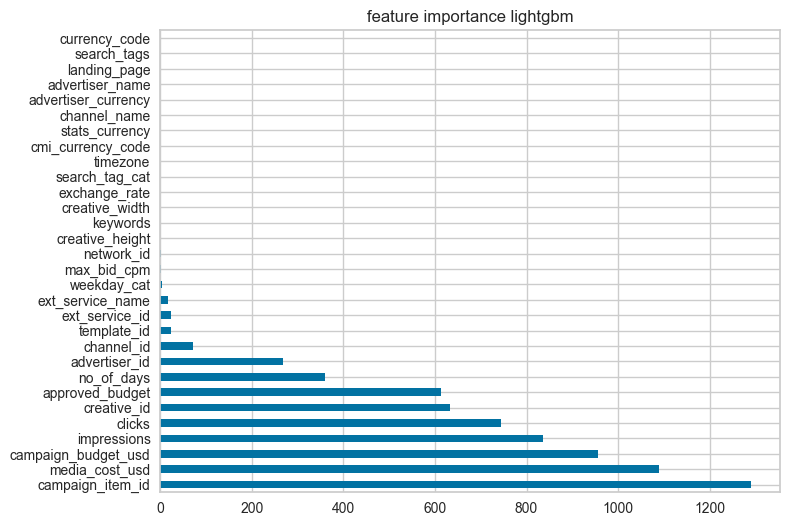

In [219]:
feat_imp=pd.Series(model.feature_importances_,index=bf_dm.columns)
feat_imp.nlargest(30).plot(kind='barh',figsize=(8,6))
plt.title('feature importance lightgbm')
plt.show()